In [25]:
from fastai.vision.all import *

In [26]:
path=untar_data(URLs.PETS)/'images'

In [27]:
files=get_image_files(path) # 이미지파일들의 이름을 모두 복붙하여 리스트를 만든뒤에 files.txt로 저장하는 과정으로 비유할 수 있음

In [28]:
files[2] # txt 파일의 3번째 목록

Path('/home/cgb4/.fastai/data/oxford-iiit-pet/images/leonberger_5.jpg')

In [29]:
def label_func(f):
    if f[0].isupper():
        return 'cat' 
    else: 
        return 'dog' 

In [30]:
label_func('asdf')

'dog'

In [31]:
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(224)) 

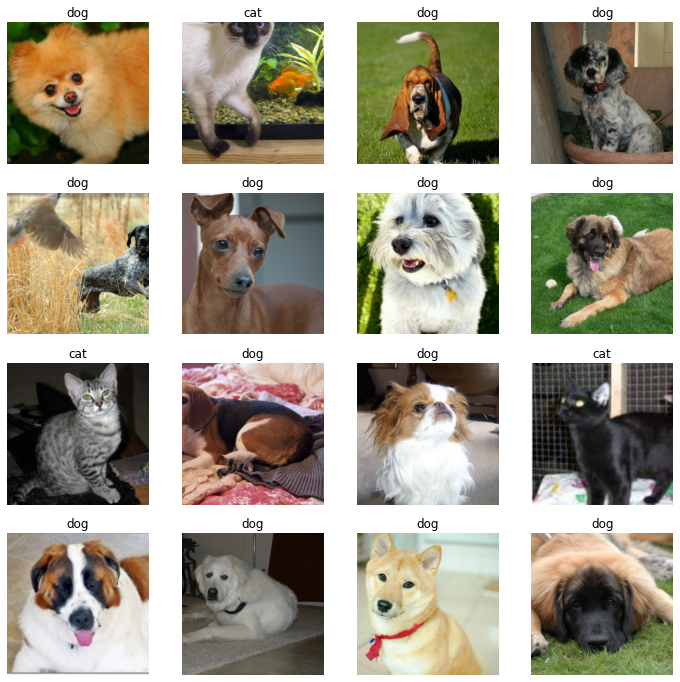

In [32]:
dls.show_batch(max_n=16)

In [28]:
learn=cnn_learner(dls,resnet34,metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to C:\Users\cgb/.cache\torch\hub\checkpoints\resnet34-b627a593.pth


ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

`-` 에러를 해결하기 위해서는 아래를 설치하면 된다. 

In [33]:
# !conda install -c conda-forge jupyterlab_widgets -y 
# !conda install -c conda-forge ipywidgets -y 
# !conda install -c conda-forge nodejs -y 

`-` 위를 설치하고 커널을 재시작하면 정상적으로 모형이 만들어진다. 

In [34]:
learn=cnn_learner(dls,resnet34,metrics=error_rate)

In [35]:
learn.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.144466,0.020612,0.008119,00:09


epoch,train_loss,valid_loss,error_rate,time
0,0.062860,0.018618,0.005413,00:11


In [36]:
learn.predict(files[0])

('dog', tensor(1), tensor([2.4075e-07, 1.0000e+00]))

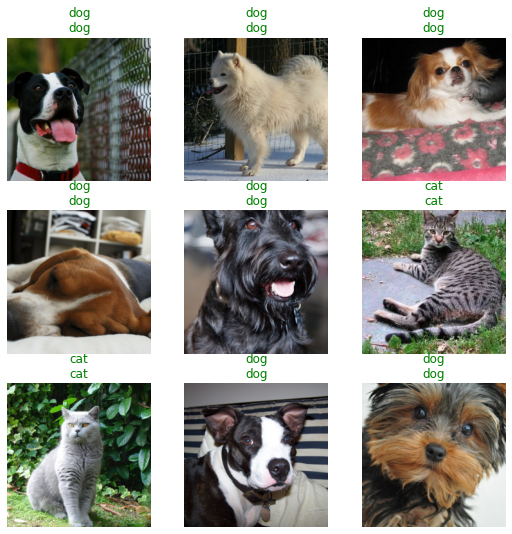

In [37]:
learn.show_results()

### 오답분석 

In [38]:
interp = Interpretation.from_learner(learn)

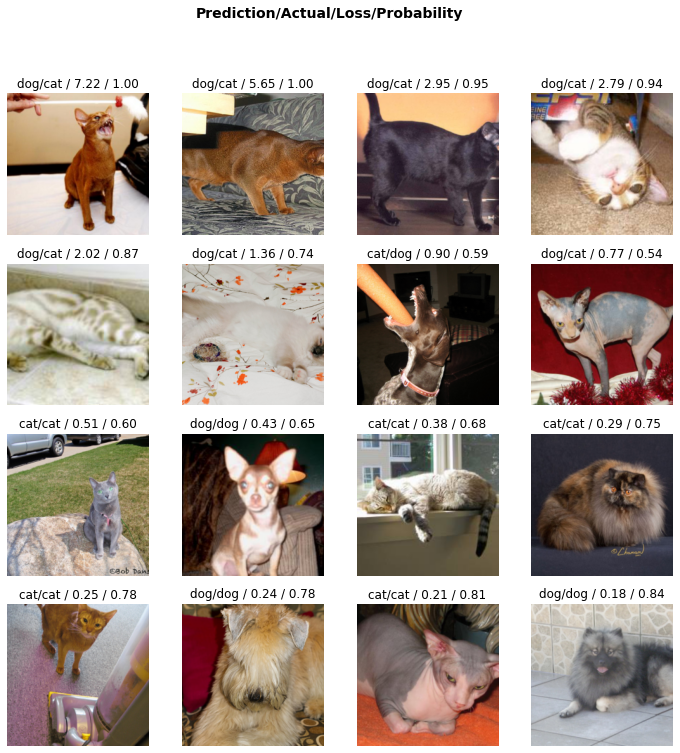

In [39]:
interp.plot_top_losses(16)

### 진짜 잘되는게 맞는건가? 

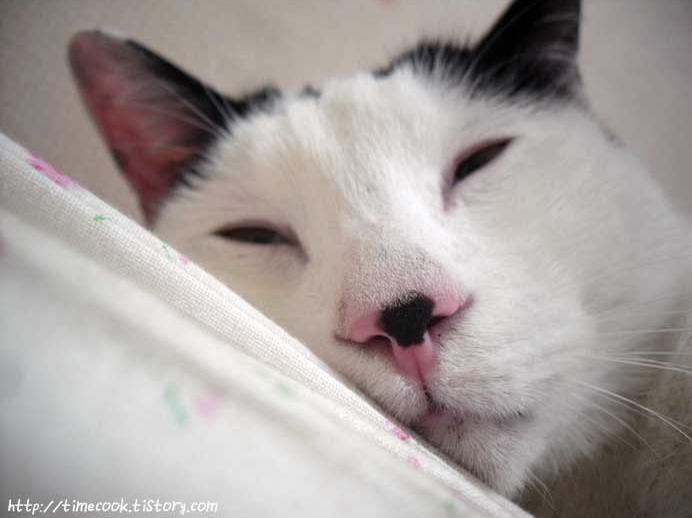

In [40]:
PILImage.create('2021-09-06-cat1.png')

In [41]:
learn.predict(PILImage.create('2021-09-06-cat1.png'))

('cat', tensor(0), tensor([1.0000e+00, 1.0442e-07]))

`-` 헷갈리는 고양이 사진인데 잘 구분한다. 

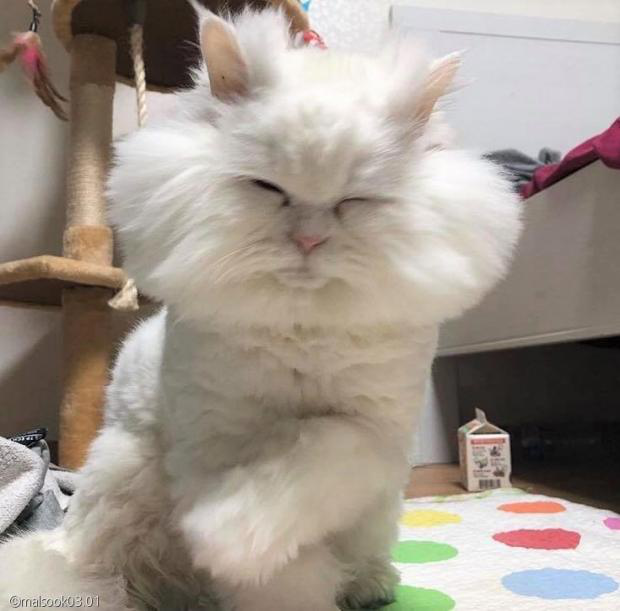

In [42]:
PILImage.create('2021-09-06-cat2.jpeg')

In [43]:
learn.predict(PILImage.create('2021-09-06-cat2.jpeg'))

('cat', tensor(0), tensor([1.0000e+00, 3.3645e-06]))

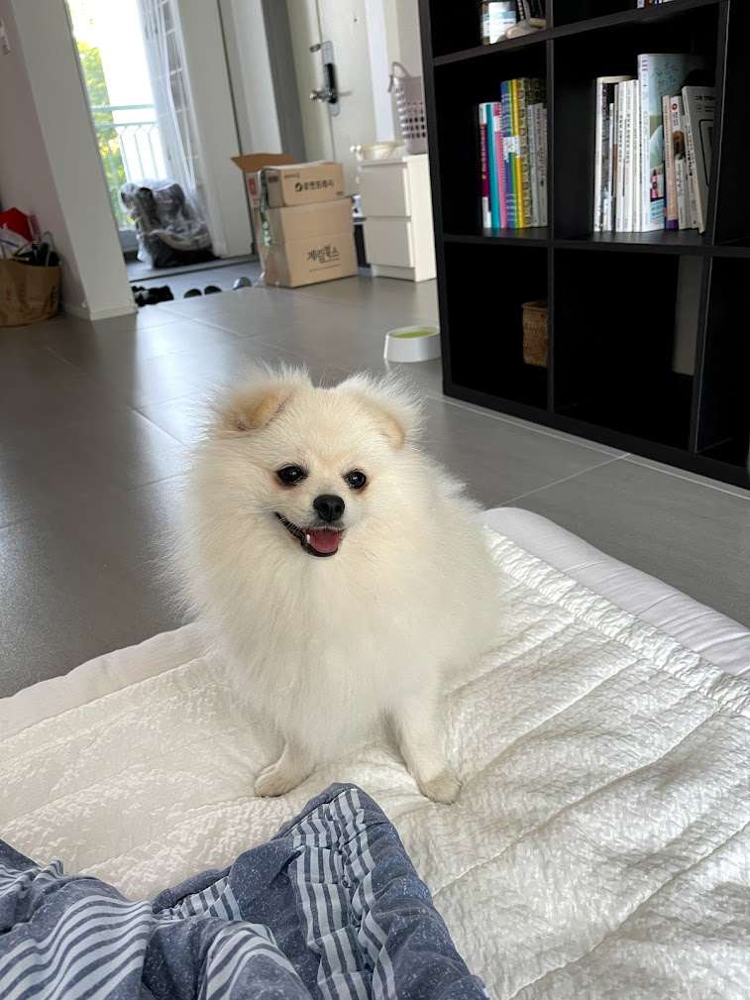

In [44]:
PILImage.create('2021-09-06-hani01.jpeg')

In [45]:
learn.predict(PILImage.create('2021-09-06-hani01.jpeg'))

('dog', tensor(1), tensor([3.1670e-06, 1.0000e+00]))

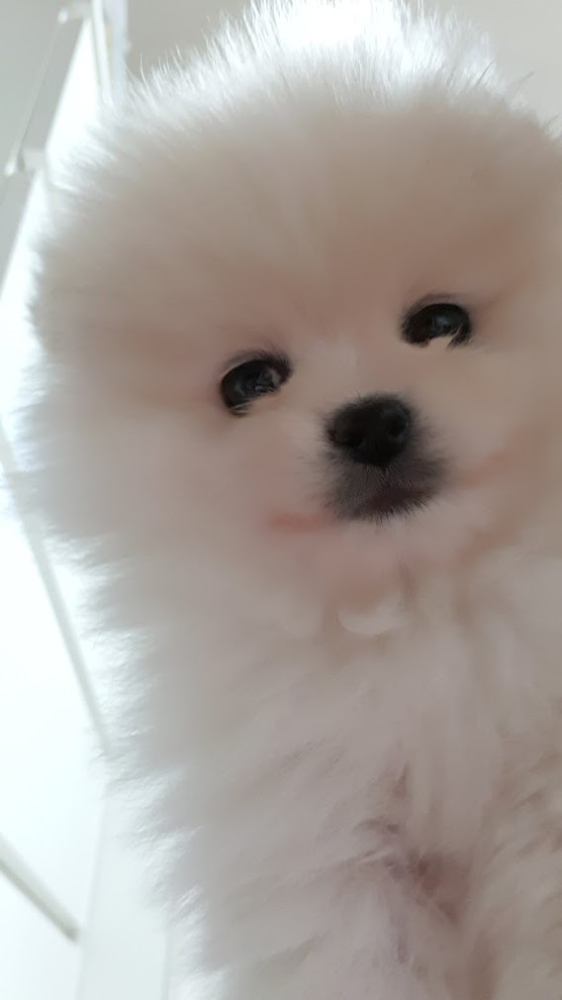

In [46]:
PILImage.create('2021-09-06-hani02.jpeg')

In [47]:
learn.predict(PILImage.create('2021-09-06-hani02.jpeg'))

('dog', tensor(1), tensor([8.1501e-06, 9.9999e-01]))

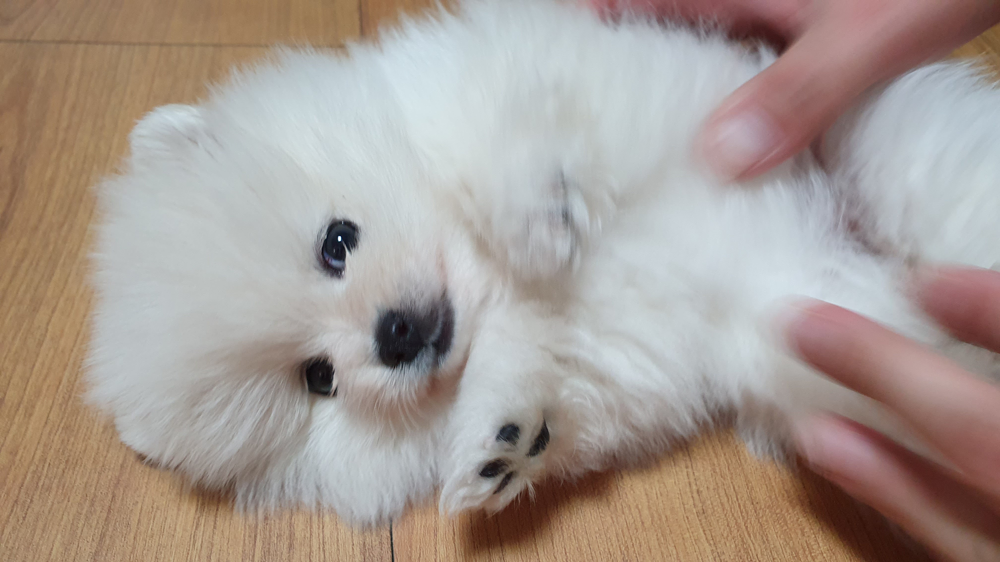

In [48]:
PILImage.create('2021-09-06-hani03.jpg')

In [49]:
learn.predict(PILImage.create('2021-09-06-hani03.jpg'))

('dog', tensor(1), tensor([0.0270, 0.9730]))

### 다음시간 
- 이미지 크롤링 --> 데이터셋트 --> A,B 구분하는 모델 

### 숙제 
- 위의 사진들 이외에 사진들을 바탕으로 예측을 하는 모형구축. 
- 예측결과를 스샷으로 저장하여 제출 (이미지도 함께 스샷할것) 

### 숙제참고자료 

In [51]:
import PIL 
urls='https://t1.daumcdn.net/cfile/tistory/9925F03C5AD486B033'
urllib.request.urlretrieve(urls,'temp.png')
learn.predict(PILImage.create('temp.png'))

('dog', tensor(1), tensor([0.0091, 0.9909]))